In [2]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from object_detection.data_decoders import tf_example_decoder

from xml.dom import minidom
from xml.etree.ElementTree import Element, SubElement, ElementTree

In [3]:
def make_elements(dom, root_node, element_map):
    """ add sub-node for root_node """
    node = dom.createElement(element_map.get('name'))
    root_node.appendChild(node)
    if element_map.get('text') != 'None':
        text = dom.createTextNode(str(element_map.get('text')))
        node.appendChild(text)
    if element_map.get('sub') != 'None':
        for item in element_map.get('sub'):
            make_elements(dom, node, item)

In [4]:
def write_labels(img_name, boxes, label_path):
    print(label_path + img_name + '.txt')
    f = open(label_path + img_name + '.txt', 'w')
    for box in boxes:
        f.write(
            str(14) + ' '
            + str((box[1] + box[3]) / 2) + ' '
            + str((box[0] + box[2]) / 2) + ' '
            + str(box[3] - box[1]) + ' ' 
            + str(box[2] - box[0])+ '\n')
    f.close()

In [5]:
def write_to_voc(image_raw, save_path):
    """ generate annotations from tfrecord only one image infomation """
    image = image_raw['image'][...,::-1] # BGR <=> RGB
    img_name = str(image_raw['source_id'], encoding='utf-8')
    if img_name.split('.')[-1] != 'jpg':
        img_name = img_name + '.jpg'
    img_path = save_path + 'JPEGImages/' + img_name
    cv2.imwrite(img_path, image)
    xml_path = save_path + 'Annotations/' + img_name.rsplit('.', 1)[0] + '.xml'
    img_shape = image_raw['original_image_spatial_shape']
    classes = image_raw['groundtruth_classes']
    boxes = image_raw['groundtruth_boxes']
    
    label_path = save_path + 'labels/'
    write_labels(img_name.rsplit('.', 1)[0], boxes, label_path)
    
    dom = minidom.Document()
    root_node = dom.createElement('annotation')
    dom.appendChild(root_node)
    
    root_common_subelements = [
        {'name': 'folder', 'text': 'person', 'sub': 'None'},
        {'name': 'filename', 'text': img_name, 'sub': 'None'},
        {'name': 'source', 'text': 'None', 'sub': [
            {'name': 'database', 'text': 'The VOC2007 Database', 'sub': 'None'},
            {'name': 'annotation', 'text': 'PASCAL VOC2007', 'sub': 'None'},
            {'name': 'image', 'text': 'default', 'sub': 'None'},
            {'name': 'flickrid', 'text': 'default', 'sub': 'None'},
        ]},
        {'name': 'owner', 'text': 'None', 'sub': [
            {'name': 'flickrid', 'text': 'defalut', 'sub': 'None'},
            {'name': 'name', 'text': 'defalut', 'sub': 'None'},
        ]},
        {'name': 'size', 'text': 'None', 'sub': [
            {'name': 'width', 'text': img_shape[1], 'sub': 'None'},
            {'name': 'height', 'text': img_shape[0], 'sub': 'None'},
            {'name': 'depth', 'text': 3, 'sub': 'None'},
        ]},
        {'name': 'segmented', 'text': 0, 'sub': 'None'},
    ]
    for common_suelement in root_common_subelements:
        make_elements(dom=dom, root_node=root_node, element_map=common_suelement)
        
    for category, box in zip(classes, boxes):
        element_map = {
            'name': 'object', 
            'text': 'None',
            'sub': [
                {'name': 'name', 'text': 'person', 'sub': 'None'},
                {'name': 'pose', 'text': 'Left', 'sub': 'None'},
                {'name': 'truncated', 'text': 1, 'sub': 'None'},
                {'name': 'difficult', 'text': 0, 'sub': 'None'},
                {'name': 'bndbox', 'text': 'None', 'sub': [
                    {'name': 'xmin', 'text': int(box[1] * img_shape[1]), 'sub': 'None'},
                    {'name': 'ymin', 'text': int(box[0] * img_shape[0]), 'sub': 'None'},
                    {'name': 'xmax', 'text': int(box[3] * img_shape[1]), 'sub': 'None'},
                    {'name': 'ymax', 'text': int(box[2] * img_shape[0]), 'sub': 'None'}
                ]}
            ]
        }
        make_elements(dom, root_node, element_map)
    
    with open(xml_path, 'w') as xml:
        dom.writexml(xml, indent='', addindent='\t', newl='\n', encoding='utf-8')
        print('write to {} done'.format(xml_path))

In [6]:
def read_tf_records(tf_record_path):
    """ read tfrecord from record path """
    graph = tf.Graph()
    label_map_proto_file = None
    config = tf.ConfigProto(
        device_count={'GPU': 0}
    )
    with graph.as_default():
        decoder = tf_example_decoder.TfExampleDecoder(
            label_map_proto_file=label_map_proto_file
        )

        dataset = tf.data.TFRecordDataset(tf_record_path)
        dataset = dataset.map(decoder.decode)

        iterator = dataset.make_one_shot_iterator()
        next_element = iterator.get_next()
        with tf.train.MonitoredTrainingSession(config=config) as sess:
            while not sess.should_stop():
                example = sess.run(next_element)
                yield example

                
def generate_voc(dataset, voc_folder, show_num, show_num_steps):
    """  generate voc dataset from tensorflow dataset """
    for idx, example in enumerate(dataset):
        image = example['image']
        detection_dict = dict(
            detection_boxes=example['groundtruth_boxes'],
            detection_classes=example['groundtruth_classes'],
            detection_scores=np.ones(example['groundtruth_classes'].shape)
        )
        write_to_voc(example, voc_folder)
        img_shape = example['original_image_spatial_shape']
        boxes = example['groundtruth_boxes']
        if idx < show_num and idx % show_num_steps == 0:
            print(idx)
            figure = plt.figure()
            ax = figure.add_subplot(1,1,1)
            ax.imshow(image)
            for box in boxes:
                y1 = box[0] * img_shape[0]
                x1 = box[1] * img_shape[1]
                y2 = box[2] * img_shape[0]
                x2 = box[3] * img_shape[1]
#                 print(width, height)
#                 print(center_x, center_y, width, height)
#                 print(img_shape[0], box[2] * img_shape[0])
                rectangle = patches.Rectangle(
                    (x1, y1), x2 - x1, y2 - y1, 
                    linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(rectangle)
            plt.show()
#         if idx == 3:
#             break
            
        
    print("show and generate ended")
    
# def show_tfrecord(dataset, )

INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000001.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000001.xml done
0


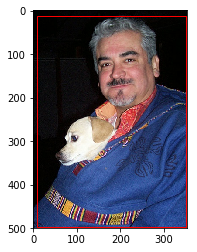

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000009.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000009.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000010.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000010.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000014.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000014.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000017.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000017.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000021.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000021.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000022.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000022.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000023.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000023.xml done
/app/chris/darknet-1/voc/VO

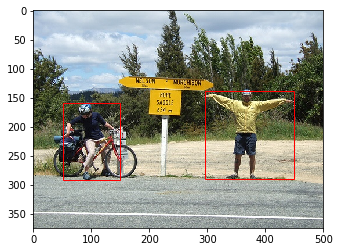

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000032.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000032.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000035.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000035.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000038.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000038.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000041.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000041.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000043.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000043.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000048.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000048.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000050.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000050.xml done
/app/chris/darknet-1/voc/VO

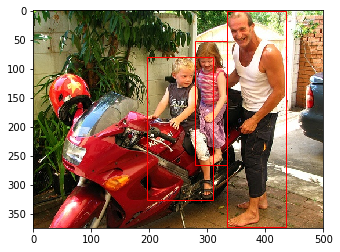

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000059.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000059.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000066.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000066.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000069.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000069.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000073.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000073.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000076.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000076.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000081.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000081.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000083.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000083.xml done
/app/chris/darknet-1/voc/VO

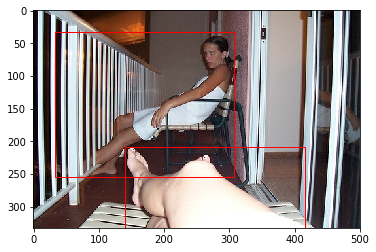

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000096.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000096.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000097.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000097.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000101.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000101.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000104.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000104.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000105.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000105.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000110.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000110.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000111.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000111.xml done
/app/chris/darknet-1/voc/VO

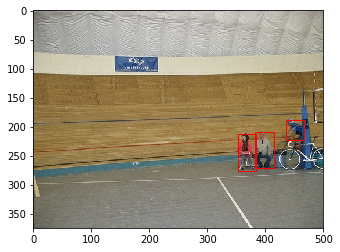

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000126.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000126.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000127.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000127.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000128.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000128.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000129.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000129.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000131.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000131.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000133.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000133.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000137.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000137.xml done
/app/chris/darknet-1/voc/VO

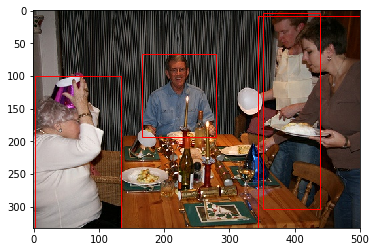

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000146.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000146.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000150.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000150.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000151.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000151.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000155.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000155.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000159.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000159.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000162.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000162.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000163.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000163.xml done
/app/chris/darknet-1/voc/VO

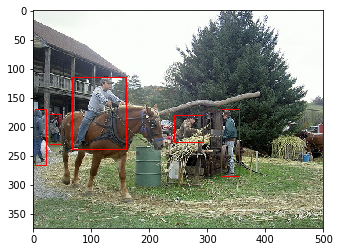

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000168.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000168.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000169.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000169.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000170.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000170.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000171.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000171.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000173.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000173.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000174.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000174.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000177.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000177.xml done
/app/chris/darknet-1/voc/VO

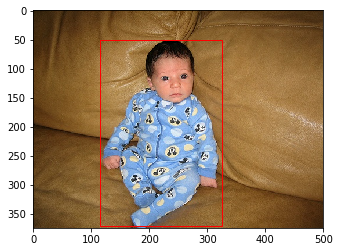

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000185.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000185.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000188.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000188.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000190.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000190.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000191.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000191.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000192.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000192.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000193.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000193.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000194.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000194.xml done
/app/chris/darknet-1/voc/VO

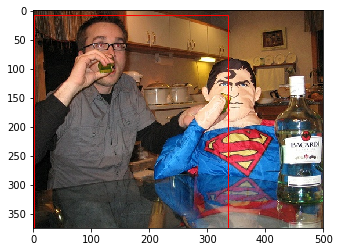

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000205.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000205.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000206.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000206.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000210.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000210.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000212.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000212.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000218.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000218.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000220.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000220.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000222.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000222.xml done
/app/chris/darknet-1/voc/VO

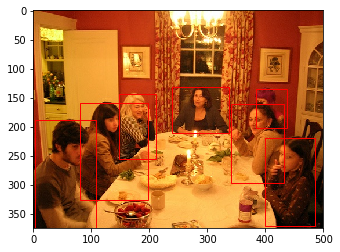

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000230.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000230.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000231.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000231.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000232.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000232.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000237.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000237.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000238.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000238.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000239.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000239.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000240.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000240.xml done
/app/chris/darknet-1/voc/VO

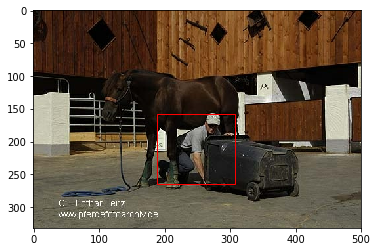

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000251.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000251.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000252.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000252.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000257.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000257.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000258.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000258.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000259.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000259.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000264.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000264.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000265.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000265.xml done
/app/chris/darknet-1/voc/VO

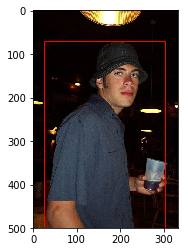

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000275.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000275.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000276.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000276.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000278.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000278.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000279.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000279.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000280.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000280.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000282.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000282.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000283.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000283.xml done
/app/chris/darknet-1/voc/VO

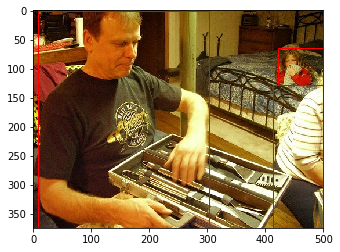

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000288.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000288.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000291.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000291.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000293.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000293.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000297.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000297.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000298.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000298.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000299.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000299.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000302.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000302.xml done
/app/chris/darknet-1/voc/VO

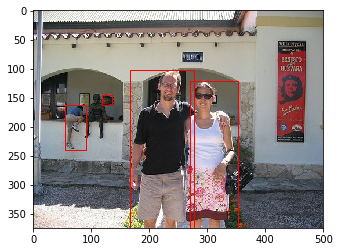

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000315.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000315.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000319.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000319.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000320.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000320.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000321.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000321.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000322.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000322.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000323.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000323.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000328.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000328.xml done
/app/chris/darknet-1/voc/VO

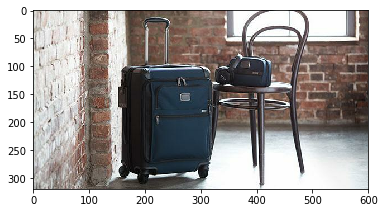

/app/chris/darknet-1/voc/VOCdevkit/person/labels/16646260468_b19767b354_o_1.width-704.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/16646260468_b19767b354_o_1.width-704.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000337.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000337.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000338.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000338.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000339.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000339.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000341.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000341.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000342.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000342.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000346.txt
write to /app/chris/darknet-1/voc/VOCdevkit/pe

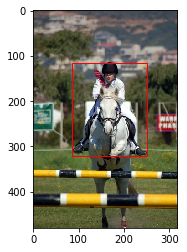

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000358.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000358.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000359.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000359.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000364.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000364.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000367.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000367.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000368.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000368.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000369.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000369.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000372.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000372.xml done
/app/chris/darknet-1/voc/VO

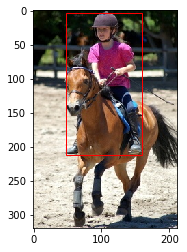

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000382.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000382.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000386.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000386.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000388.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000388.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000392.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000392.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000393.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000393.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000394.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000394.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000405.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000405.xml done
/app/chris/darknet-1/voc/VO

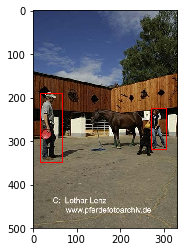

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000411.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000411.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000413.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000413.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000414.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000414.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000419.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000419.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000421.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000421.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000423.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000423.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000428.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000428.xml done
/app/chris/darknet-1/voc/VO

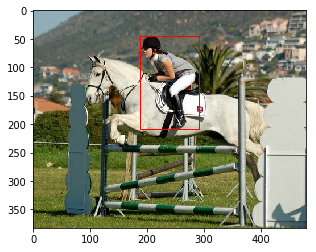

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000435.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000435.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000437.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000437.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000438.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000438.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000443.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000443.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000445.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000445.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000446.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000446.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000447.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000447.xml done
/app/chris/darknet-1/voc/VO

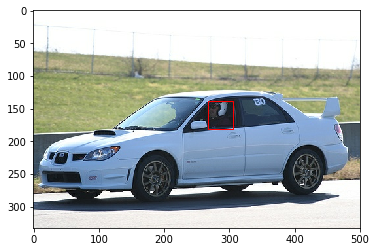

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000455.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000455.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000456.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000456.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000457.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000457.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000458.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000458.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000463.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000463.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000467.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000467.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000468.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000468.xml done
/app/chris/darknet-1/voc/VO

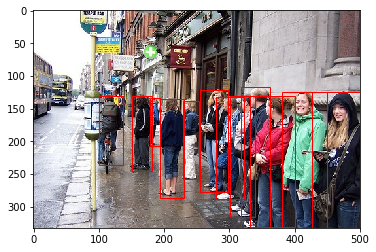

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000479.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000479.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000480.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000480.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000482.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000482.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000483.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000483.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000485.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000485.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000490.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000490.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000493.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000493.xml done
/app/chris/darknet-1/voc/VO

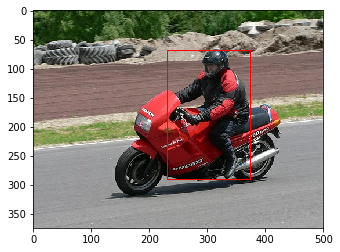

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000500.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000500.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000502.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000502.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000504.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000504.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000506.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000506.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000507.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000507.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000516.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000516.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000517.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000517.xml done
/app/chris/darknet-1/voc/VO

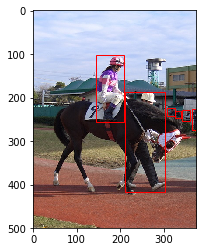

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000524.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000524.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000525.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000525.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000526.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000526.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000527.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000527.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000530.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000530.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000531.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000531.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000532.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000532.xml done
/app/chris/darknet-1/voc/VO

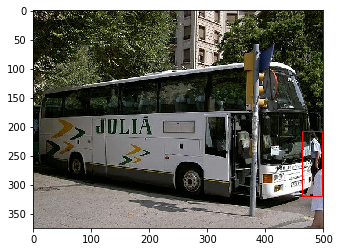

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000538.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000538.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000539.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000539.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000545.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000545.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000546.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000546.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000547.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000547.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000554.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000554.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000555.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000555.xml done
/app/chris/darknet-1/voc/VO

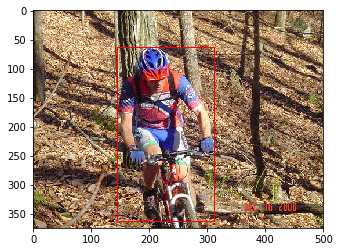

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000570.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000570.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000578.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000578.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000579.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000579.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000586.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000586.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000587.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000587.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000589.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000589.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000591.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000591.xml done
/app/chris/darknet-1/voc/VO

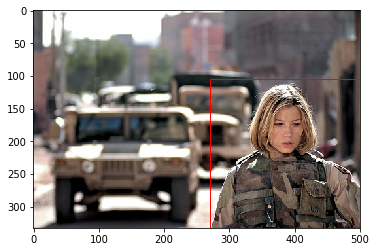

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000604.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000604.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000606.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000606.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000607.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000607.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000612.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000612.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000613.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000613.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000615.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000615.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000616.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000616.xml done
/app/chris/darknet-1/voc/VO

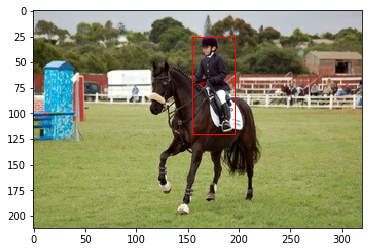

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000624.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000624.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000625.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000625.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000626.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000626.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000629.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000629.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000630.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000630.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000633.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000633.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000634.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000634.xml done
/app/chris/darknet-1/voc/VO

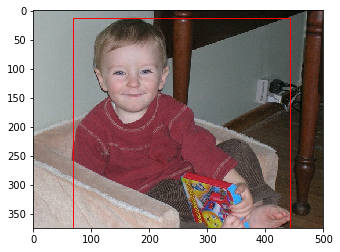

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000643.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000643.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000644.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000644.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000649.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000649.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000652.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000652.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000654.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000654.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000655.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000655.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000662.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000662.xml done
/app/chris/darknet-1/voc/VO

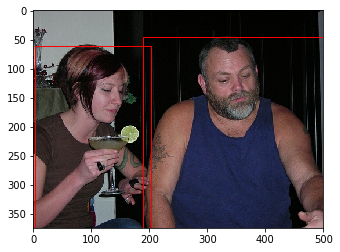

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000677.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000677.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000683.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000683.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000684.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000684.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000687.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000687.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000688.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000688.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000690.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000690.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000692.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000692.xml done
/app/chris/darknet-1/voc/VO

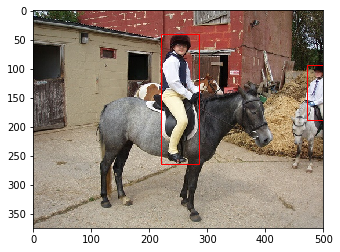

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000696.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000696.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000697.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000697.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000701.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000701.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000702.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000702.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000704.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000704.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000709.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000709.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000715.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000715.xml done
/app/chris/darknet-1/voc/VO

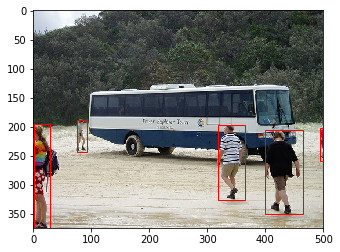

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000726.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000726.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000727.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000727.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000731.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000731.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000733.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000733.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000734.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000734.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000735.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000735.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000739.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000739.xml done
/app/chris/darknet-1/voc/VO

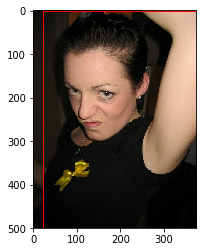

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000752.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000752.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000753.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000753.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000758.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000758.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000760.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000760.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000762.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000762.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000765.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000765.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000766.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000766.xml done
/app/chris/darknet-1/voc/VO

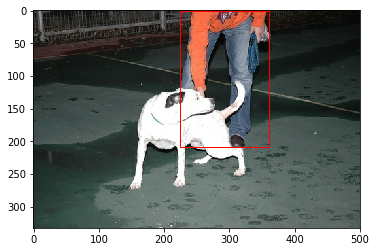

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000781.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000781.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000782.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000782.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000783.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000783.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000784.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000784.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000793.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000793.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000797.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000797.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000798.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000798.xml done
/app/chris/darknet-1/voc/VO

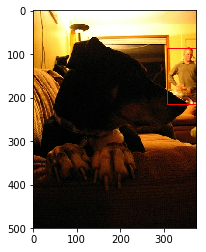

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000806.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000806.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000807.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000807.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000810.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000810.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000812.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000812.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000814.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000814.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000816.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000816.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000819.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000819.xml done
/app/chris/darknet-1/voc/VO

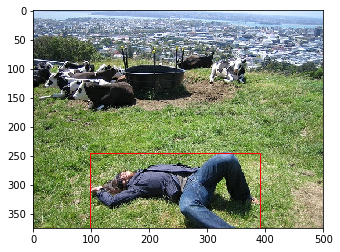

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000836.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000836.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000839.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000839.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000843.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000843.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000847.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000847.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000848.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000848.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000851.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000851.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000854.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000854.xml done
/app/chris/darknet-1/voc/VO

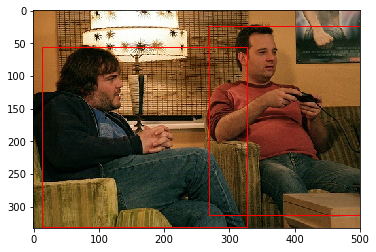

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000860.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000860.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000861.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000861.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000865.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000865.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000866.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000866.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000869.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000869.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000870.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000870.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000874.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000874.xml done
/app/chris/darknet-1/voc/VO

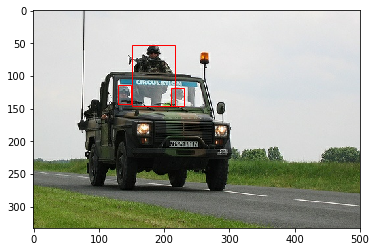

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000885.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000885.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000886.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000886.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000891.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000891.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000892.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000892.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000895.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000895.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000898.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000898.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000901.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000901.xml done
/app/chris/darknet-1/voc/VO

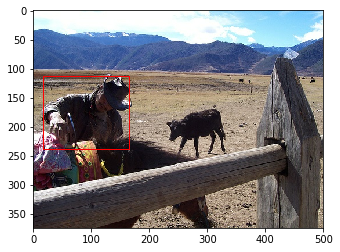

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000906.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000906.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000907.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000907.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000909.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000909.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000910.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000910.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000911.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000911.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000913.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000913.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000915.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000915.xml done
/app/chris/darknet-1/voc/VO

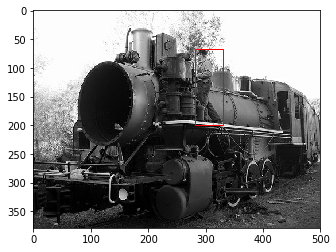

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000922.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000922.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000926.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000926.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000927.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000927.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000930.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000930.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000939.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000939.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000940.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000940.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000942.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000942.xml done
/app/chris/darknet-1/voc/VO

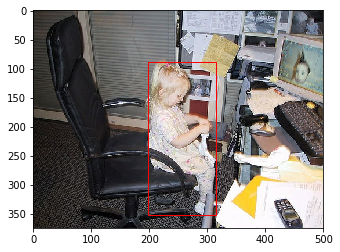

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000949.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000949.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000952.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000952.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000955.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000955.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000956.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000956.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000959.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000959.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000967.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000967.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000969.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000969.xml done
/app/chris/darknet-1/voc/VO

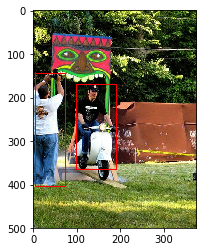

/app/chris/darknet-1/voc/VOCdevkit/person/labels/000981.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000981.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000984.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000984.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000986.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000986.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000987.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000987.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000988.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000988.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000990.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000990.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/000991.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/000991.xml done
/app/chris/darknet-1/voc/VO

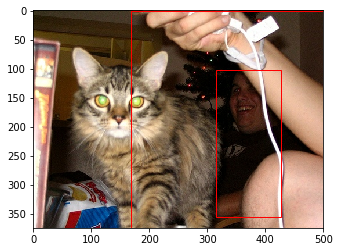

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001006.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001006.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001011.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001011.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001014.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001014.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001017.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001017.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001020.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001020.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001021.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001021.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001024.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001024.xml done
/app/chris/darknet-1/voc/VO

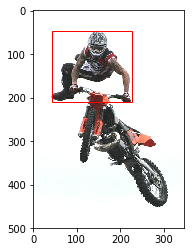

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001033.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001033.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001035.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001035.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001036.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001036.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001037.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001037.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001038.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001038.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001040.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001040.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001042.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001042.xml done
/app/chris/darknet-1/voc/VO

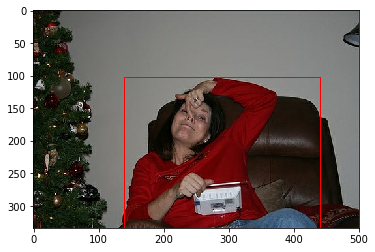

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001057.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001057.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001060.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001060.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001061.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001061.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001063.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001063.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001064.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001064.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001065.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001065.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001066.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001066.xml done
/app/chris/darknet-1/voc/VO

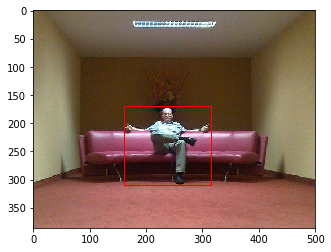

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001076.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001076.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001079.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001079.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001084.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001084.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001085.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001085.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001086.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001086.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001091.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001091.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001095.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001095.xml done
/app/chris/darknet-1/voc/VO

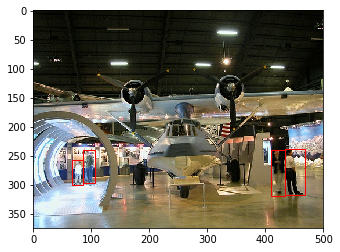

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001101.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001101.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001105.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001105.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001108.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001108.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001109.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001109.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001113.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001113.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001116.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001116.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001118.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001118.xml done
/app/chris/darknet-1/voc/VO

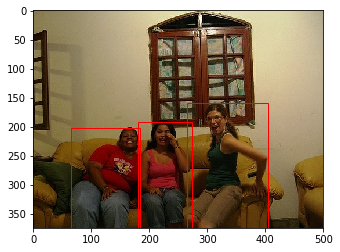

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001137.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001137.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001140.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001140.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001141.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001141.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001145.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001145.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001147.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001147.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001150.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001150.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001151.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001151.xml done
/app/chris/darknet-1/voc/VO

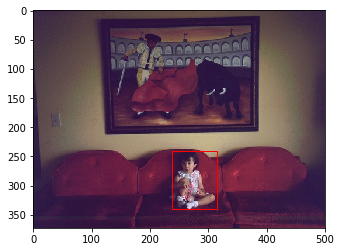

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001164.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001164.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001165.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001165.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001167.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001167.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001168.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001168.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001169.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001169.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001170.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001170.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001171.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001171.xml done
/app/chris/darknet-1/voc/VO

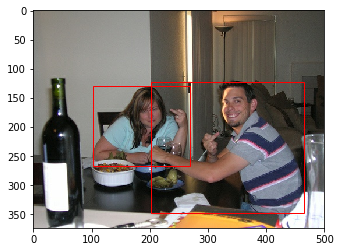

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001180.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001180.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001183.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001183.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001185.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001185.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001186.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001186.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001198.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001198.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001201.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001201.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001206.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001206.xml done
/app/chris/darknet-1/voc/VO

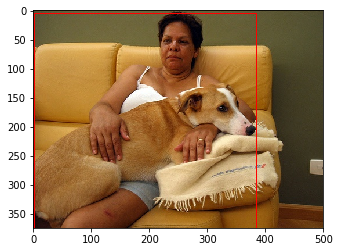

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001221.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001221.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001222.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001222.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001224.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001224.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001227.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001227.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001228.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001228.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001229.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001229.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001234.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001234.xml done
/app/chris/darknet-1/voc/VO

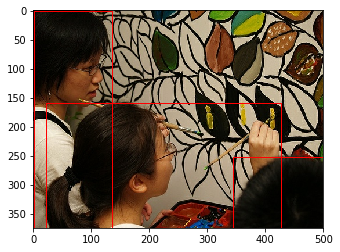

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001241.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001241.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001242.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001242.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001243.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001243.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001244.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001244.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001245.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001245.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001248.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001248.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001251.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001251.xml done
/app/chris/darknet-1/voc/VO

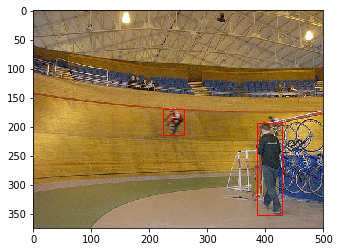

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001259.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001259.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001261.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001261.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001265.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001265.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001266.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001266.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001267.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001267.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001269.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001269.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001271.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001271.xml done
/app/chris/darknet-1/voc/VO

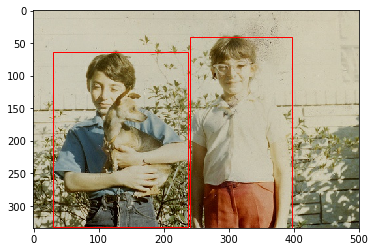

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001284.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001284.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001287.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001287.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001292.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001292.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001296.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001296.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001297.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001297.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001298.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001298.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001301.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001301.xml done
/app/chris/darknet-1/voc/VO

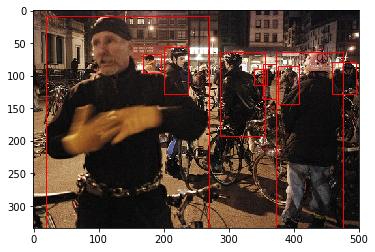

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001309.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001309.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001310.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001310.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001311.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001311.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001315.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001315.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001319.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001319.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001320.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001320.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001325.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001325.xml done
/app/chris/darknet-1/voc/VO

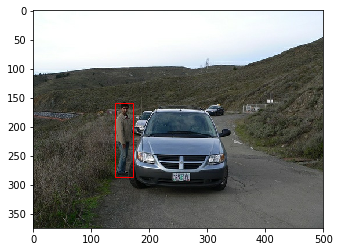

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001333.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001333.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001336.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001336.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001337.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001337.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001340.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001340.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001342.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001342.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001346.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001346.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001347.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001347.xml done
/app/chris/darknet-1/voc/VO

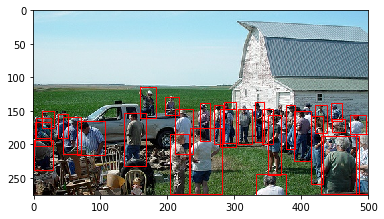

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001353.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001353.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001354.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001354.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001357.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001357.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001358.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001358.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001362.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001362.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001363.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001363.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001366.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001366.xml done
/app/chris/darknet-1/voc/VO

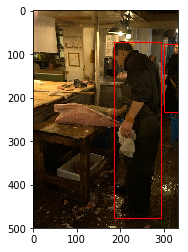

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001376.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001376.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001382.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001382.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001388.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001388.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001390.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001390.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001392.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001392.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001393.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001393.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001396.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001396.xml done
/app/chris/darknet-1/voc/VO

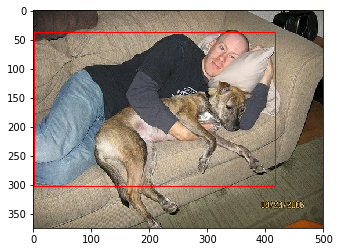

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001408.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001408.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001409.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001409.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001411.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001411.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001412.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001412.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001414.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001414.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001417.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001417.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001419.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001419.xml done
/app/chris/darknet-1/voc/VO

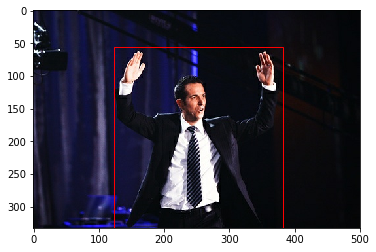

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001424.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001424.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001426.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001426.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001427.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001427.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001429.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001429.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001430.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001430.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001431.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001431.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001434.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001434.xml done
/app/chris/darknet-1/voc/VO

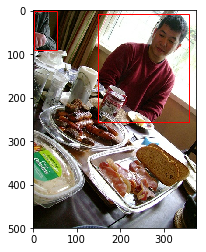

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001445.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001445.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001446.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001446.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001447.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001447.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001448.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001448.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001450.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001450.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001451.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001451.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001452.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001452.xml done
/app/chris/darknet-1/voc/VO

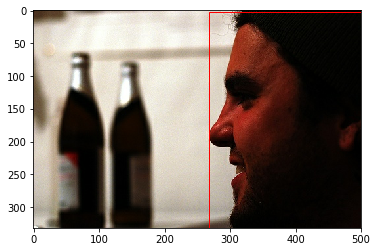

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001459.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001459.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001460.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001460.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001469.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001469.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001472.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001472.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001473.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001473.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001474.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001474.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001475.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001475.xml done
/app/chris/darknet-1/voc/VO

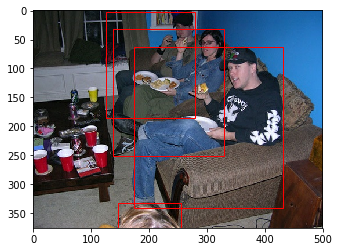

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001482.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001482.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001485.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001485.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001493.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001493.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001495.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001495.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001496.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001496.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001498.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001498.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001499.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001499.xml done
/app/chris/darknet-1/voc/VO

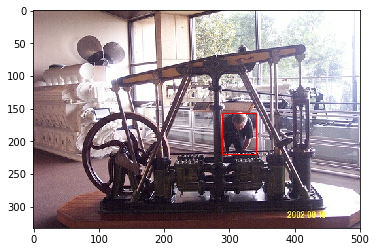

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001504.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001504.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001506.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001506.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001509.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001509.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001510.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001510.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001511.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001511.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001514.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001514.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001516.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001516.xml done
/app/chris/darknet-1/voc/VO

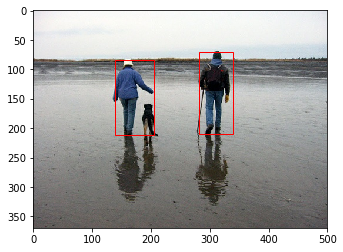

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001526.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001526.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001531.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001531.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001532.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001532.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001533.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001533.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001536.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001536.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001537.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001537.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001538.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001538.xml done
/app/chris/darknet-1/voc/VO

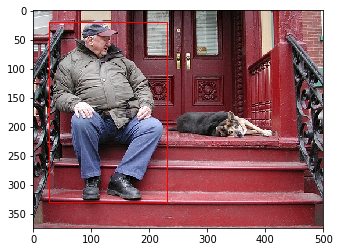

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001557.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001557.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001558.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001558.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001561.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001561.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001563.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001563.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001564.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001564.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001566.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001566.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001569.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001569.xml done
/app/chris/darknet-1/voc/VO

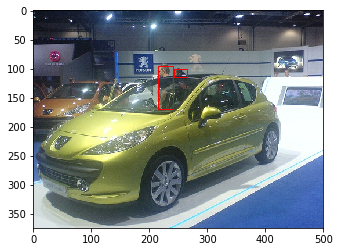

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001575.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001575.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001577.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001577.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001579.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001579.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001580.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001580.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001581.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001581.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001583.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001583.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001585.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001585.xml done
/app/chris/darknet-1/voc/VO

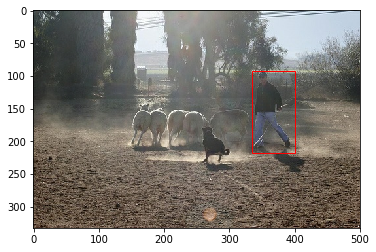

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001596.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001596.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001600.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001600.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001603.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001603.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001606.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001606.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001608.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001608.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001611.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001611.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001615.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001615.xml done
/app/chris/darknet-1/voc/VO

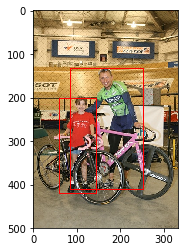

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001622.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001622.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001624.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001624.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001625.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001625.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001627.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001627.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001628.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001628.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001629.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001629.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001630.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001630.xml done
/app/chris/darknet-1/voc/VO

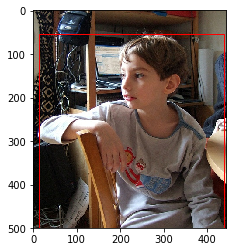

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001651.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001651.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001652.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001652.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001654.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001654.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001656.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001656.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001657.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001657.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001664.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001664.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001667.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001667.xml done
/app/chris/darknet-1/voc/VO

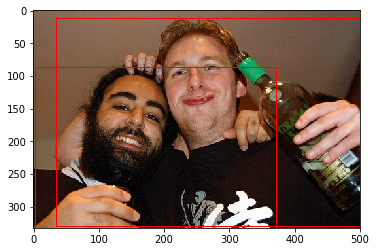

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001686.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001686.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001689.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001689.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001690.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001690.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001691.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001691.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001692.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001692.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001696.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001696.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001703.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001703.xml done
/app/chris/darknet-1/voc/VO

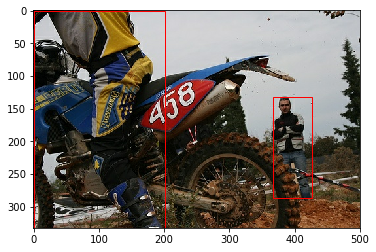

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001710.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001710.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001711.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001711.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001712.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001712.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001717.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001717.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001720.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001720.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001721.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001721.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001722.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001722.xml done
/app/chris/darknet-1/voc/VO

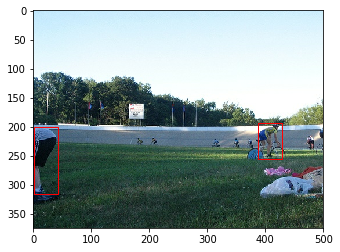

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001728.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001728.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001729.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001729.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001730.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001730.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001731.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001731.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001735.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001735.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001743.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001743.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001748.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001748.xml done
/app/chris/darknet-1/voc/VO

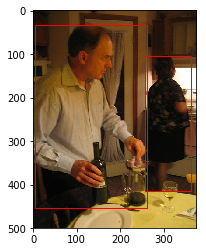

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001757.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001757.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001758.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001758.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001759.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001759.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001760.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001760.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001766.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001766.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001769.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001769.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001772.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001772.xml done
/app/chris/darknet-1/voc/VO

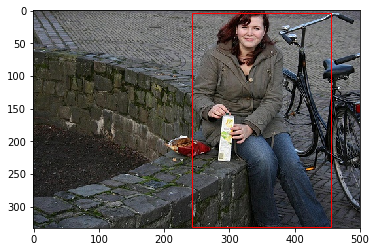

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001784.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001784.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001785.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001785.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001789.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001789.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001791.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001791.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001792.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001792.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001793.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001793.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001794.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001794.xml done
/app/chris/darknet-1/voc/VO

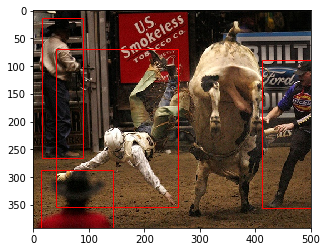

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001800.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001800.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001801.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001801.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001802.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001802.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001805.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001805.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001806.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001806.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001807.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001807.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001808.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001808.xml done
/app/chris/darknet-1/voc/VO

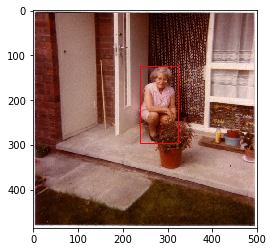

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001819.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001819.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001823.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001823.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001828.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001828.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001830.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001830.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001831.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001831.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001832.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001832.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001833.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001833.xml done
/app/chris/darknet-1/voc/VO

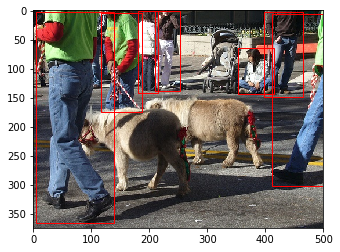

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001841.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001841.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001843.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001843.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001849.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001849.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001850.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001850.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001854.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001854.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001856.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001856.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001857.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001857.xml done
/app/chris/darknet-1/voc/VO

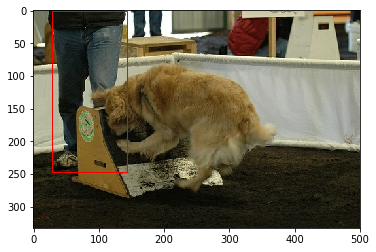

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001883.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001883.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001886.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001886.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001887.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001887.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001889.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001889.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001891.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001891.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001893.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001893.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001894.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001894.xml done
/app/chris/darknet-1/voc/VO

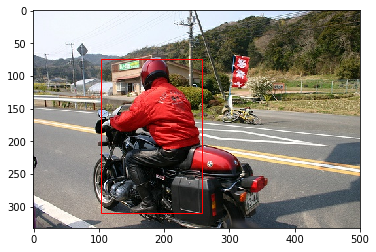

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001904.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001904.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001914.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001914.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001916.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001916.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001918.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001918.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001920.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001920.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001921.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001921.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001923.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001923.xml done
/app/chris/darknet-1/voc/VO

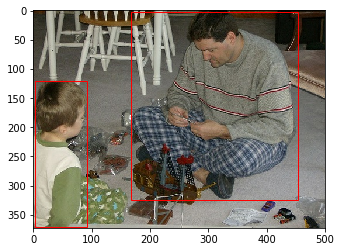

/app/chris/darknet-1/voc/VOCdevkit/person/labels/001938.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001938.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001941.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001941.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001942.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001942.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001943.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001943.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/001944.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/001944.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614102928637_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614102928637_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614103207154_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/A

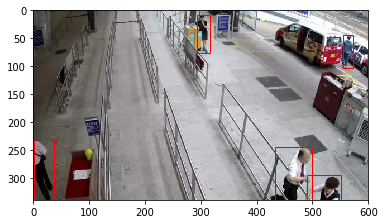

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614103853529_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614103853529_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614104008106_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614104008106_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614105658663_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614105658663_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614105716627_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614105716627_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614105724749_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614105724749_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614105842127_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

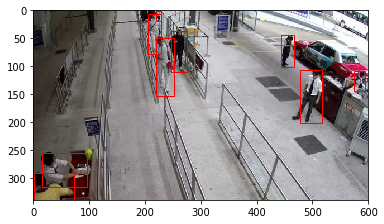

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614111219639_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614111219639_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614111435110_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614111435110_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614111445634_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614111445634_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614111744075_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614111744075_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614111840049_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614111840049_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614111908414_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

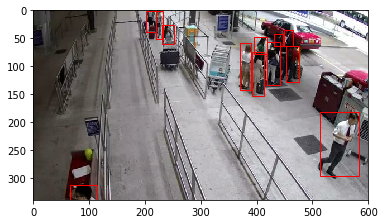

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614113138550_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614113138550_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614113810723_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614113810723_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614113908537_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614113908537_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614114501899_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614114501899_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614114646723_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614114646723_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614115317575_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

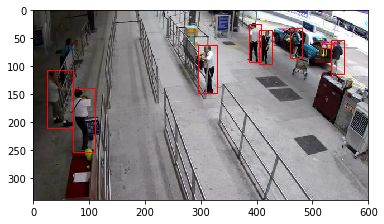

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614120448735_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614120448735_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614120557432_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614120557432_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614121144753_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614121144753_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614121840810_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614121840810_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614122257751_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614122257751_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614122414769_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

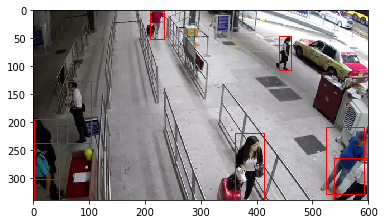

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614124329519_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614124329519_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614124642164_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614124642164_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614124642764_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614124642764_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614124659008_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614124659008_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614124845633_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614124845633_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614124852315_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

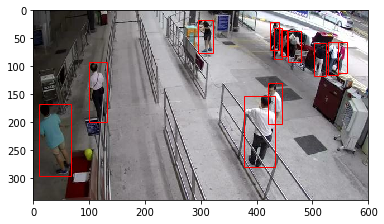

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614130132333_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614130132333_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614130653408_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614130653408_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614130842474_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614130842474_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614131413111_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614131413111_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614132041282_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614132041282_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614132107769_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

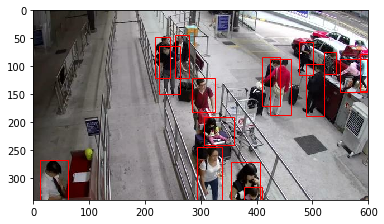

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614133641347_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614133641347_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614134120613_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614134120613_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614134540915_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614134540915_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614135614542_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614135614542_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614140723299_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614140723299_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614140756067_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

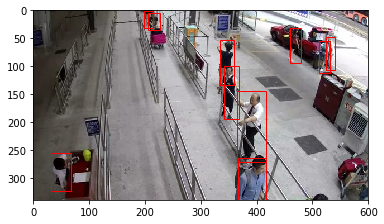

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614141359912_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614141359912_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614141930789_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614141930789_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614141940951_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614141940951_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614142443342_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614142443342_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614142539116_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614142539116_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614143034584_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

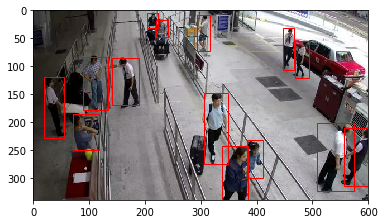

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614150008720_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614150008720_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614150157786_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614150157786_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614150212749_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614150212749_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614150731464_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614150731464_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614150914288_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614150914288_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614151341590_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/per

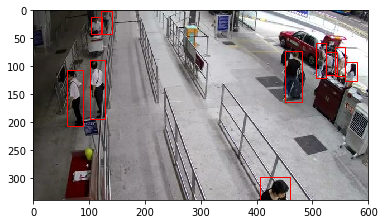

/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614152917690_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614152917690_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614153155048_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614153155048_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614153635634_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614153635634_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614154147026_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614154147026_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/20170614154259162_UTC+08.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/20170614154259162_UTC+08.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0001.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person

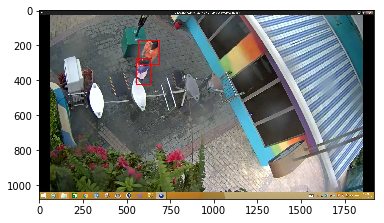

/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0006.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0006.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0007.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0007.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0008.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0008.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0009.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0009.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0010.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0010.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0011.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot

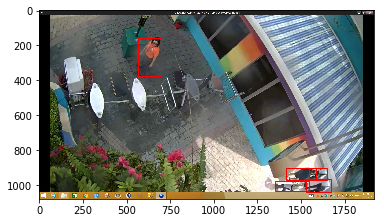

/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0016.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0016.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0017.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0017.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0018.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0018.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0019.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0019.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0020.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot0020.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op2_mpv-shot0021.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op2_mpv-shot

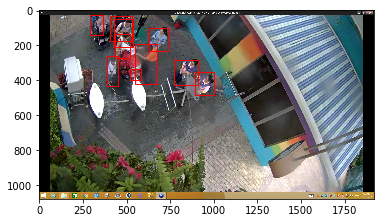

/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0002.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0002.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0003.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0003.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0004.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0004.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0005.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0005.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0006.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0006.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0007.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0007.xml don

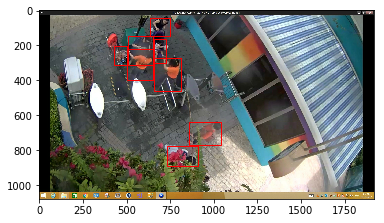

/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0012.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0012.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0013.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0013.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0014.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0014.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0015.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0015.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0016.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0016.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/2018_op_mpv-shot0017.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/2018_op_mpv-shot0017.xml don

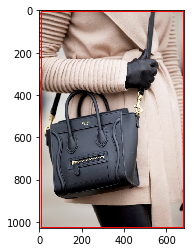

/app/chris/darknet-1/voc/VOCdevkit/person/labels/6a00d8341c630a53ef01347fb036fc970c.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/6a00d8341c630a53ef01347fb036fc970c.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/6a01156f7533eb970c017d41d05a1f970c-600wi.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/6a01156f7533eb970c017d41d05a1f970c-600wi.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/8049handluggagecheckrelaxed.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/8049handluggagecheckrelaxed.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/8df0f59c4abf30823a46922313742c6b--hard-sided-luggage-hard-luggage-set.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/8df0f59c4abf30823a46922313742c6b--hard-sided-luggage-hard-luggage-set.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/aw17_Icons_MN.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/aw17_Icons_MN.xml done

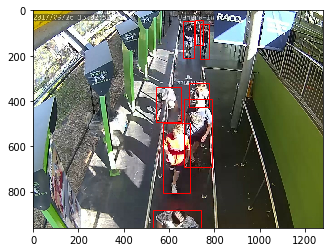

/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0004.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0004.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0005.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0005.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0006.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0006.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0007.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0007.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0008.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0008.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_peopl

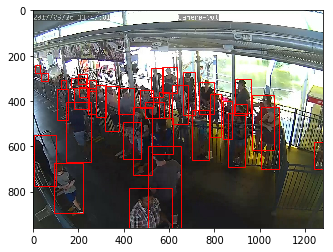

/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0014.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0014.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0015.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0015.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0016.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0016.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0017.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0017.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_people_mpv-shot0018.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/DreamWorld_people_mpv-shot0018.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/DreamWorld_peopl

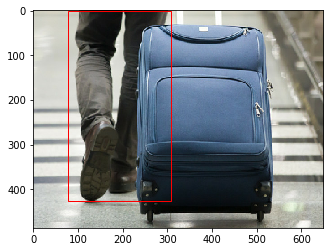

/app/chris/darknet-1/voc/VOCdevkit/person/labels/EASTtoWESTnycFlashAlternate.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/EASTtoWESTnycFlashAlternate.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00001.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00001.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00002.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00002.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00003.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00003.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00004.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00004.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00005.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00005.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00006.txt
write to /app/chris/

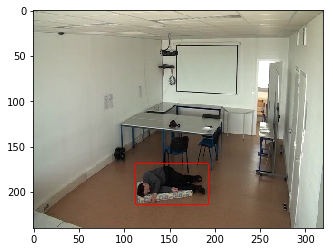

/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00010.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00010.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00011.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00011.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00012.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00012.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00013.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00013.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00014.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00014.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00015.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00015.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00016.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Ann

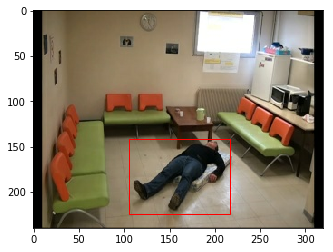

/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00020.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00020.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00021.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00021.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00022.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00022.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00023.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00023.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00024.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00024.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00025.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/fall_00025.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/fall_00026.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Ann

/app/chris/darknet-1/voc/VOCdevkit/person/labels/HKU_20171115_mpv-shot0002.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/HKU_20171115_mpv-shot0002.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/HKU_20171115_mpv-shot0003.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/HKU_20171115_mpv-shot0003.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/HKU_20171115_mpv-shot0004.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/HKU_20171115_mpv-shot0004.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/HKU_20171115_mpv-shot0005.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/HKU_20171115_mpv-shot0005.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/HKU_20171115_mpv-shot0006.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/HKU_20171115_mpv-shot0006.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/HKU_20171115_mpv-shot0007.txt
write to /app/chris/darknet-1/voc/VO

/app/chris/darknet-1/voc/VOCdevkit/person/labels/MAA1_000014.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/MAA1_000014.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/MAA1_000015.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/MAA1_000015.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/MAA1_000016.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/MAA1_000016.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/MAA1_000017.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/MAA1_000017.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/MAA1_000018.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/MAA1_000018.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/MAA1_000019.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/MAA1_000019.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/MAA1_000020.txt
write to /app/chris/darknet-1/voc/VOCdevk

/app/chris/darknet-1/voc/VOCdevkit/person/labels/Museum_People_mpv-shot0005.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/Museum_People_mpv-shot0005.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/Museum_People_mpv-shot0006.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/Museum_People_mpv-shot0006.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/Museum_People_mpv-shot0007.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/Museum_People_mpv-shot0007.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/Museum_People_mpv-shot0008.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/Museum_People_mpv-shot0008.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/Museum_People_mpv-shot0009.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/Museum_People_mpv-shot0009.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/Museum_People_mpv-shot0010.txt
write to /app/chris/darkn

/app/chris/darknet-1/voc/VOCdevkit/person/labels/train_out000009.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/train_out000009.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/train_out000010.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/train_out000010.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/train_out000011.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/train_out000011.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/train_out000012.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/train_out000012.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/train_out000013.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/train_out000013.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/train_out000014.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/train_out000014.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/train_out

/app/chris/darknet-1/voc/VOCdevkit/person/labels/vlcsnap-00003.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/vlcsnap-00003.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/vlcsnap-00004.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/vlcsnap-00004.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/vlcsnap-00005.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/vlcsnap-00005.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/vlcsnap-00006.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/vlcsnap-00006.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/vlcsnap-00007.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/vlcsnap-00007.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/vlcsnap-00008.txt
write to /app/chris/darknet-1/voc/VOCdevkit/person/Annotations/vlcsnap-00008.xml done
/app/chris/darknet-1/voc/VOCdevkit/person/labels/vlcsnap-00009.txt
write to /app/c

In [8]:
tfrecord_location = os.path.abspath('./records/')
# name = "Person_20191018_10.record"
name = "train.record"
# name = "test.record"
# name = "Person_20191018_10.record"
filename = os.path.join(tfrecord_location, name)
record_exists = os.path.exists(filename)
record_exists

voc_folder = "/app/chris/darknet-1/voc/VOCdevkit/person/"
annotations_folder = voc_folder + 'Annotations/'
images_folder = voc_folder + 'JPEGImages/'
dataset = read_tf_records(filename)
generate_voc(dataset, voc_folder, show_num=1000, show_num_steps=10)

In [ ]:
def write_train_txt():
    train_txt = voc_folder + 'ImageSets/Main/train.txt'
    print(train_txt)
    if os.path.exists(train_txt):
        os.remove(train_txt)
    print(annotations_folder)
    with open(train_txt, 'a') as f:
        for xml_path in os.listdir(annotations_folder):
            f.write(images_folder + xml_path.rsplit('.', 1)[0] + '.jpg' + '\n')
#             f.write(xml_path.rsplit('.', 1)[0] + '\n')
        f.close()
write_train_txt()